## 2.1. Installing Package

In [1]:
pip install chart-studio

Note: you may need to restart the kernel to use updated packages.


## 2.2. Importing libraries

In [2]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt 
from datetime import datetime, date

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list the files in the input directory

from plotly import tools
from chart_studio import plotly as py
import plotly as py
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
import plotly.graph_objs as go
import gc

import matplotlib.pyplot as plt
import seaborn as sns

from scipy.stats import norm, skew
from scipy import stats

from sklearn.metrics import mean_absolute_error, mean_squared_error
import math

import warnings # Supress warnings 
warnings.filterwarnings('ignore')


from subprocess import check_output


## 2.3. First look at the data

In [3]:
df = pd.read_csv("Aquifer_Petrignano.csv")
df.describe()

,Rainfall_Bastia_Umbra,Depth_to_Groundwater_P24,Depth_to_Groundwater_P25,Temperature_Bastia_Umbra,Temperature_Petrignano,Volume_C10_Petrignano,Hydrometry_Fiume_Chiascio_Petrignano
count,4199.000000,5168.000000,5184.000000,4199.000000,4199.000000,5025.000000,4199.000000
mean,1.556633,-26.263723,-25.692926,15.030293,13.739081,-29043.296726,2.372517
std,5.217923,3.319858,3.214165,7.794871,7.701369,4751.864371,0.589088
min,0.000000,-34.470000,-33.710000,-3.700000,-4.200000,-45544.896000,0.000000
25%,0.000000,-28.250000,-27.620000,8.800000,7.700000,-31678.560000,2.100000
50%,0.000000,-25.990000,-25.540000,14.700000,13.500000,-28689.120000,2.400000
75%,0.100000,-23.820000,-23.430000,21.400000,20.000000,-26218.080000,2.700000
max,67.300000,-19.660000,-19.100000,33.000000,31.100000,0.000000,4.100000


In [4]:
# Drop one of the target columns, so we can focus on only one target
df = df.drop(['Depth_to_Groundwater_P24', 'Temperature_Petrignano'], axis=1)

# Simplify column names
df.columns = ['Date', 'Rainfall', 'Depth_to_Groundwater', 'Temperature', 'Drainage_Volume', 'River_Hydrometry']

targets = ['Depth_to_Groundwater']
features = [feature for feature in df.columns if feature not in targets]
df.head()

,Date,Rainfall,Depth_to_Groundwater,Temperature,Drainage_Volume,River_Hydrometry
0,14/03/2006,NaN,-22.18,NaN,NaN,NaN
1,15/03/2006,NaN,-22.14,NaN,NaN,NaN
2,16/03/2006,NaN,-22.04,NaN,NaN,NaN
3,17/03/2006,NaN,-22.04,NaN,NaN,NaN
4,18/03/2006,NaN,-22.04,NaN,NaN,NaN


The data seems to have a lot of missing values. Let's see how they're distributed in the timeline

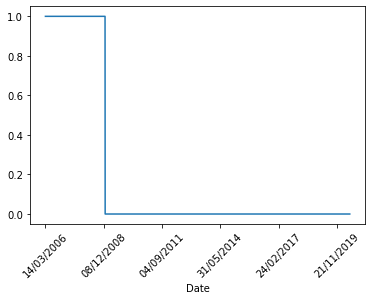

In [5]:
df[['Rainfall','Date']].set_index(df.Date).Rainfall.isnull().astype(int).plot()
plt.xticks(rotation=45)
plt.show()

There's no point in imputing those values, let's just drop those rows.

In [6]:
# Good practices

# Sort values by timestamp (not necessary in this case)
#df = df.sort_values(by='Date')

# Check time intervals
#df['Time_Interval'] = df.Date - df.Date.shift(1)

#df[['Date', 'Time_Interval']].Time_Interval.value_counts()

In [7]:
df = df[df.Rainfall.notna()].reset_index(drop=True)
df.isnull().sum().sort_values(ascending = False)

Depth_to_Groundwater    27
Drainage_Volume          1
Date                     0
Rainfall                 0
Temperature              0
River_Hydrometry         0
dtype: int64

In [8]:
#Converting the date to date_time format
df['Date'] = pd.to_datetime(df.Date, format = '%d/%m/%Y')
df.head()

,Date,Rainfall,Depth_to_Groundwater,Temperature,Drainage_Volume,River_Hydrometry
0,2009-01-01,0.0,-31.14,5.2,-24530.688,2.4
1,2009-01-02,0.0,-31.11,2.3,-28785.888,2.5
2,2009-01-03,0.0,-31.07,4.4,-25766.208,2.4
3,2009-01-04,0.0,-31.05,0.8,-27919.296,2.4
4,2009-01-05,0.0,-31.01,-1.9,-29854.656,2.3


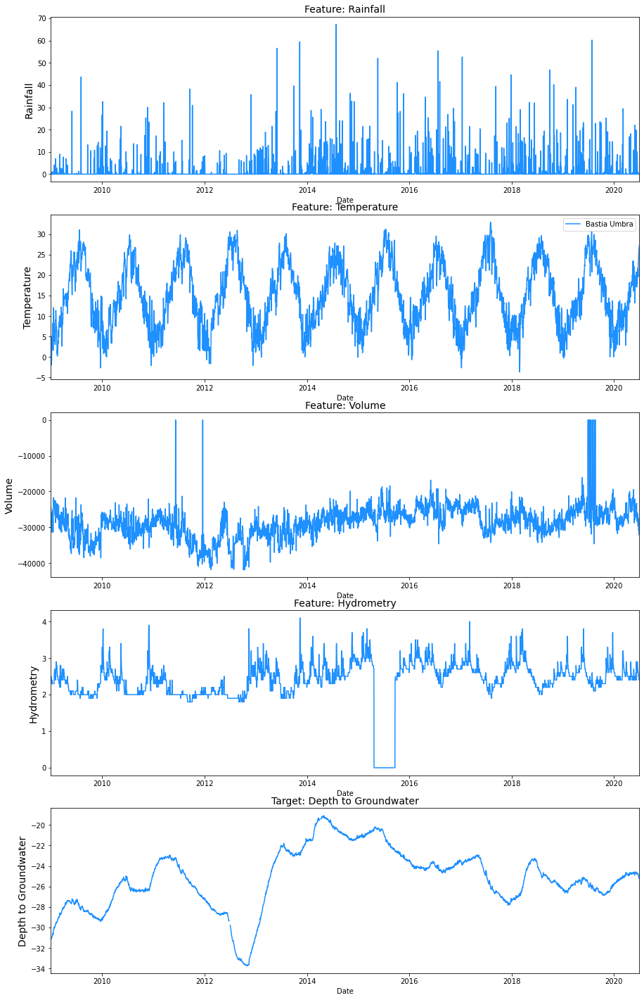

In [9]:
f, ax = plt.subplots(nrows=5, ncols=1, figsize=(15, 25))

sns.lineplot(x=df.Date, y=df.Rainfall.fillna(np.inf), ax=ax[0], color='dodgerblue')
ax[0].set_title('Feature: Rainfall', fontsize=14)
ax[0].set_ylabel(ylabel='Rainfall', fontsize=14)


sns.lineplot(x=df.Date, y=df.Temperature.fillna(np.inf), ax=ax[1], color='dodgerblue',label='Bastia Umbra')
ax[1].set_title('Feature: Temperature', fontsize=14)
ax[1].set_ylabel(ylabel='Temperature', fontsize=14)


sns.lineplot(x=df.Date, y=df.Drainage_Volume.fillna(np.inf), ax=ax[2], color='dodgerblue')
ax[2].set_title('Feature: Volume', fontsize=14)
ax[2].set_ylabel(ylabel='Volume', fontsize=14)


sns.lineplot(x=df.Date, y=df.River_Hydrometry.fillna(np.inf), ax=ax[3], color='dodgerblue')
ax[3].set_title('Feature: Hydrometry', fontsize=14)
ax[3].set_ylabel(ylabel='Hydrometry', fontsize=14)


sns.lineplot(x=df.Date, y=df.Depth_to_Groundwater.fillna(np.inf), ax=ax[4], color='dodgerblue')
ax[4].set_title('Target: Depth to Groundwater', fontsize=14)
ax[4].set_ylabel(ylabel='Depth to Groundwater', fontsize=14)


for i in range(5):
    ax[i].set_xlim([date(2009, 1, 1), date(2020, 6, 30)])

plt.show()


## 2.4. Plots of the data

In order to save us some hard coding, let's define a function to draw interactive plots using plotly.

In [10]:
def plot_time_series(df,Date, var, df2=False, var2 = False):
        # We use Plotly to create the plots https://plot.ly/python/
    trace1 = go.Scatter(
        x = df[Date],
        y = df[var].astype(float),
        mode = 'lines',
        name = 'Original'
    )
    
    if(var2 != False):
        trace2 = go.Scatter(
            x = df2[Date],
            y = df2[var2].astype(float),
            mode = 'lines',
            name = 'Imputed'
        )
    
    layout = dict(
        title='Historical ' + var + ' data with the Slider ',
        xaxis=dict(
            rangeselector=dict(
                buttons=list([
                    #change the count to desired amount of months.
                    dict(count=1,
                         label='1m',
                         step='month',
                         stepmode='backward'),
                    dict(count=6,
                         label='6m',
                         step='month',
                         stepmode='backward'),
                    dict(count=12,
                         label='1y',
                         step='month',
                         stepmode='backward'),
                    dict(count=36,
                         label='3y',
                         step='month',
                         stepmode='backward'),
                    dict(step='all')
                ])
            ),
            rangeslider=dict(
                visible = True
            ),
            type='date'
        )
    )
    
    data = [trace1]
    if(var2 != False):
        data = [trace2,trace1]
    
    fig = dict(data=data, layout=layout)
    iplot(fig, filename = "Time Series with Rangeslider")

### 2.4.1. Rainfall:

In [11]:
plot_time_series(df,'Date', 'Rainfall')

### 2.4.2. Temperature:

In [12]:
plot_time_series(df,'Date', 'Temperature')

### 2.4.3. Hydrometry:

In [13]:
plot_time_series(df,'Date', 'River_Hydrometry')

### 2.4.4. Volume:

In [14]:
plot_time_series(df,'Date', 'Drainage_Volume')

### 2.4.5. Depth to Groundwater:

In [15]:
plot_time_series(df,'Date', 'Depth_to_Groundwater')

In [16]:
df.head()

,Date,Rainfall,Depth_to_Groundwater,Temperature,Drainage_Volume,River_Hydrometry
0,2009-01-01,0.0,-31.14,5.2,-24530.688,2.4
1,2009-01-02,0.0,-31.11,2.3,-28785.888,2.5
2,2009-01-03,0.0,-31.07,4.4,-25766.208,2.4
3,2009-01-04,0.0,-31.05,0.8,-27919.296,2.4
4,2009-01-05,0.0,-31.01,-1.9,-29854.656,2.3


# 3. Missing values

## 3.1. Visualizing the missing data:

### 3.1.1. Hydrometry:

In [17]:
Hyd_original = df.copy()

In [18]:
df['River_Hydrometry'] = np.where((df.River_Hydrometry == 0),np.nan, df.River_Hydrometry)
plot_time_series(df,'Date', 'River_Hydrometry',Hyd_original,'River_Hydrometry' )

#### Ffill:

In [19]:
plot_time_series(df,'Date', 'River_Hydrometry',df.ffill(),'River_Hydrometry' )

#### Interpolate:

In [20]:
plot_time_series(df,'Date', 'River_Hydrometry',df.interpolate(),'River_Hydrometry' )

### 3.1.2 Volume:

For the volume, let's try to fill those values and visualize it

In [21]:
Vol_original = df.copy()
df['Drainage_Volume'] = np.where((df.Drainage_Volume == 0),np.nan, df.Drainage_Volume)
plot_time_series(df,'Date', 'Drainage_Volume',Vol_original,'Drainage_Volume' )

#### Ffill:

In [22]:
plot_time_series(df,'Date', 'Drainage_Volume',df.ffill(),'Drainage_Volume' )

#### Interpolate:

In [23]:
plot_time_series(df,'Date', 'Drainage_Volume',df.interpolate(),'Drainage_Volume' )

So, let's stick with interpolate

In [24]:
df['Drainage_Volume'] = df['Drainage_Volume'].interpolate()
df['River_Hydrometry'] = df['River_Hydrometry'].interpolate()
df['Depth_to_Groundwater'] = df['Depth_to_Groundwater'].interpolate()

# 4. Resampling:

In [25]:
from plotly.subplots import make_subplots
fig = make_subplots(rows=4, cols=2,subplot_titles=("Daily Rainfall", 'Weekly Rainfall',
                                                   'Monthly Rainfall', 'Daily Temperature','Weekly Temperature',
                                                  'Monthly Temperature'),shared_xaxes=True)
fig.add_trace(
    go.Scatter(x=df.Date, y=df.Rainfall,
              mode = 'lines',
              name = 'Daily Rainfall'),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=df[['Date','Rainfall']].resample('7D', on='Date').sum().reset_index(drop=False).Date,
               y=df[['Date','Rainfall']].resample('7D', on='Date').sum().reset_index(drop=False).Rainfall,
               mode = 'lines',
               name = 'Weekly Rainfall'),
    row=2, col=1
)


fig.add_trace(
    go.Scatter(x=df[['Date','Rainfall']].resample('M', on='Date').sum().reset_index(drop=False).Date,
               y=df[['Date','Rainfall']].resample('M', on='Date').sum().reset_index(drop=False).Rainfall,
               mode = 'lines',
               name = 'Monthly Rainfall'),
    row=3, col=1
)


fig.add_trace(
    go.Scatter(x=df.Date, y=df.Temperature,
              mode = 'lines',
              name = 'Daily Temperature'),
    row=1, col=2
)

fig.add_trace(
    go.Scatter(x=df[['Date','Temperature']].resample('7D', on='Date').mean().reset_index(drop=False).Date,
               y=df[['Date','Temperature']].resample('7D', on='Date').mean().reset_index(drop=False).Temperature,
               mode = 'lines',
               name = 'Weekly Temperature'),
    row=2, col=2
)


fig.add_trace(
    go.Scatter(x=df[['Date','Temperature']].resample('M', on='Date').mean().reset_index(drop=False).Date,
               y=df[['Date','Temperature']].resample('M', on='Date').mean().reset_index(drop=False).Temperature,
               mode = 'lines',
               name = 'Monthly Temperature'),
    row=3, col=2
)
fig.update_layout(height=800, width=1000, title_text="Sampling visualization")
fig.show()

In this example, resampling would not be necessary. On the other hand, there is no necessity to look at the daily data. Considering weekly data seems to be sufficient as well. Therefore, we will downsample the data to a weekly basis.

In [26]:
df_downsampled = df[['Date',
                     'Depth_to_Groundwater', 
                     'Temperature',
                     'Drainage_Volume', 
                     'River_Hydrometry'
                    ]].resample('7D', on='Date').mean().reset_index(drop=False)

#Since rainfall makes sense to be summed up
df_downsampled['Rainfall'] = df[['Date',
                                 'Rainfall'
                                ]].resample('7D', on='Date').sum().reset_index(drop=False)[['Rainfall']]

df = df_downsampled

# 4. Stationarity

Some time-series models, such as ARIMA, assume that the underlying data is stationary. Stationarity describes that the time-series has

constant mean and mean is not time-dependent
constant variance and variance is not time-dependent
constant covariance and covariance is not time-dependent
If a time series has a specific (stationary) behavior over a given time interval, then it can be assumed that the time series will behave the same at a later time.

Time series with trend and/or seasonality are not stationary. Trend indicates that the mean is not constant over time and seasonality indicates that the variance is not constant over time.

The check for stationarity can be done via three different approaches:

- Visually: plot time series and check for trends or seasonality
- Basic statistics: split time series and compare the mean and variance of each partition
- Statistical test: Augmented Dickey Fuller test

Let's do the visual check first. We can see that all features except Temperature have non-constant mean and non-constant variance. Therefore, none of these seem to be stationary. However, Temperature shows strong seasonality (hot in summer, cold in winter) and therefore it is not stationary either.

## 4.1. Visual check

In [27]:
def plot_rolling_series(df,Date, var,roll):
        # We use Plotly to create the plots https://plot.ly/python/
    trace1 = go.Scatter(
        x = df[Date],
        y = df[var].astype(float),
        mode = 'lines',
        name = 'Original'
    )
    
    trace2 = go.Scatter(
        x = df[Date],
        y = df[var].astype(float).rolling(roll).mean(),
        mode = 'lines',
        name = 'Rolling mean'
        )
    
    trace3 = go.Scatter(
        x = df[Date],
        y = df[var].astype(float).rolling(roll).std(),
        mode = 'lines',
        name = 'Rolling std'
        )    
    
    layout = dict(
        title='Historical ' + var + ' data with the Slider ',
        xaxis=dict(
            rangeselector=dict(
                buttons=list([
                    #change the count to desired amount of months.
                    dict(count=1,
                         label='1m',
                         step='month',
                         stepmode='backward'),
                    dict(count=6,
                         label='6m',
                         step='month',
                         stepmode='backward'),
                    dict(count=12,
                         label='1y',
                         step='month',
                         stepmode='backward'),
                    dict(count=36,
                         label='3y',
                         step='month',
                         stepmode='backward'),
                    dict(step='all')
                ])
            ),
            rangeslider=dict(
                visible = True
            ),
            type='date'
        )
    )
    
    data = [trace1,trace2,trace3]
    
    fig = dict(data=data, layout=layout)
    iplot(fig, filename = "Time Series with Rangeslider")

In [28]:
plot_rolling_series(df,'Date', 'Rainfall',30)

In [29]:
plot_rolling_series(df,'Date', 'River_Hydrometry',30)

In [30]:
plot_rolling_series(df,'Date', 'Temperature',30)

In [31]:
plot_rolling_series(df,'Date', 'Drainage_Volume',30)

In [32]:
plot_rolling_series(df,'Date', 'Depth_to_Groundwater',30)

Temperature and River_Hydrometry show somewhat similar (constant) mean and variance and could be seen as stationary. However, with this method, we are not able to see the seasonality in the Temperature feature.

Let's evaluate the histograms. Since we are looking at the mean and variance, we are expecting that the data conforms to a Gaussian distribution (bell shaped distribution) in case of stationarity.

## 4.2. Distributions

In [33]:
def diagnostic_plots(df, variable):
    # function takes a dataframe (df) and
    # the variable of interest as arguments

    # define figure size
    plt.figure(figsize=(16, 4))

    # histogram
    plt.subplot(1, 3, 1)
    sns.distplot(df[variable],fit=norm, bins=30)
    plt.title('Histogram')

    # Q-Q plot
    plt.subplot(1, 3, 2)
    stats.probplot(df[variable], dist="norm", plot=plt)
    plt.ylabel('Variable quantiles')

    # boxplot
    plt.subplot(1, 3, 3)
    sns.boxplot(y=df[variable])
    plt.title('Boxplot')

    plt.show()
    

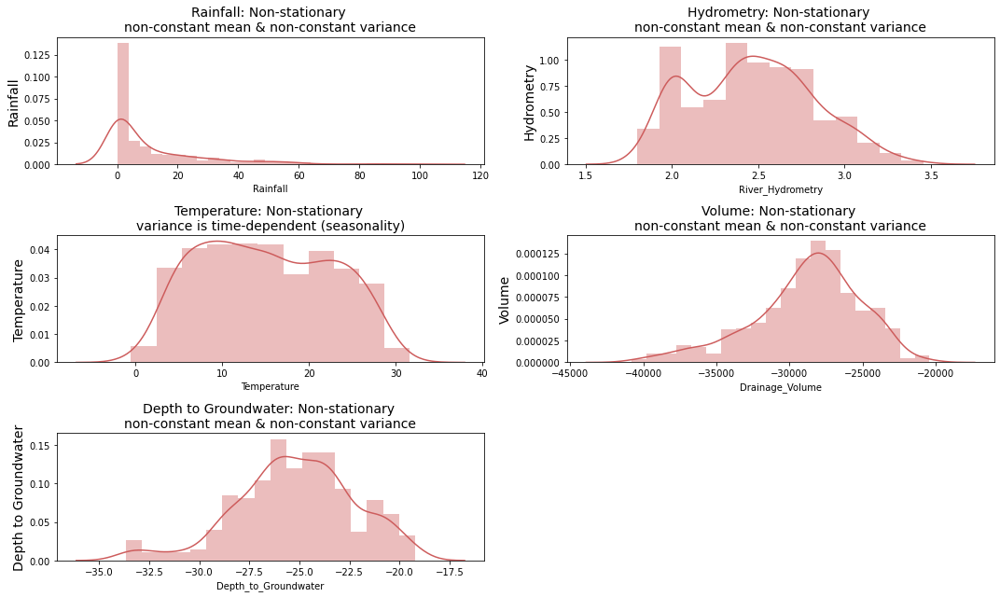

In [34]:
f, ax = plt.subplots(nrows=3, ncols=2, figsize=(15, 9))

sns.distplot(df.Rainfall.fillna(np.inf), ax=ax[0, 0], color='indianred')
ax[0, 0].set_title('Rainfall: Non-stationary \nnon-constant mean & non-constant variance', fontsize=14)
ax[0, 0].set_ylabel(ylabel='Rainfall', fontsize=14)

sns.distplot(df.Temperature.fillna(np.inf), ax=ax[1, 0], color='indianred')
ax[1, 0].set_title('Temperature: Non-stationary \nvariance is time-dependent (seasonality)', fontsize=14)
ax[1, 0].set_ylabel(ylabel='Temperature', fontsize=14)

sns.distplot(df.River_Hydrometry.fillna(np.inf), ax=ax[0, 1], color='indianred')
ax[0, 1].set_title('Hydrometry: Non-stationary \nnon-constant mean & non-constant variance', fontsize=14)
ax[0, 1].set_ylabel(ylabel='Hydrometry', fontsize=14)

sns.distplot(df.Drainage_Volume.fillna(np.inf), ax=ax[1, 1], color='indianred')
ax[1, 1].set_title('Volume: Non-stationary \nnon-constant mean & non-constant variance', fontsize=14)
ax[1, 1].set_ylabel(ylabel='Volume', fontsize=14)

sns.distplot(df.Depth_to_Groundwater.fillna(np.inf), ax=ax[2, 0], color='indianred')
ax[2, 0].set_title('Depth to Groundwater: Non-stationary \nnon-constant mean & non-constant variance', fontsize=14)
ax[2, 0].set_ylabel(ylabel='Depth to Groundwater', fontsize=14)

f.delaxes(ax[2, 1])
plt.tight_layout()
plt.show()

## 4.3. Augmented Dickey-Fuller test

In [35]:
from statsmodels.tsa.stattools import adfuller

result = adfuller(df.Depth_to_Groundwater.values)
adf_stat = result[0]
p_val = result[1]
crit_val_1 = result[4]['1%']
crit_val_5 = result[4]['5%']
crit_val_10 = result[4]['10%']

In [36]:
def visualize_adfuller_results(series, title, ax):
    result = adfuller(series)
    significance_level = 0.05
    adf_stat = result[0]
    p_val = result[1]
    crit_val_1 = result[4]['1%']
    crit_val_5 = result[4]['5%']
    crit_val_10 = result[4]['10%']

    if (p_val < significance_level) & ((adf_stat < crit_val_1)):
        linecolor = 'forestgreen' 
    elif (p_val < significance_level) & (adf_stat < crit_val_5):
        linecolor = 'gold'
    elif (p_val < significance_level) & (adf_stat < crit_val_10):
        linecolor = 'orange'
    else:
        linecolor = 'indianred'
    sns.lineplot(x=df.Date, y=series, ax=ax, color=linecolor)
    ax.set_title(f'ADF Statistic {adf_stat:0.3f}, p-value: {p_val:0.3f}\nCritical Values 1%: {crit_val_1:0.3f}, 5%: {crit_val_5:0.3f}, 10%: {crit_val_10:0.3f}', fontsize=14)
    ax.set_ylabel(ylabel=title, fontsize=14)

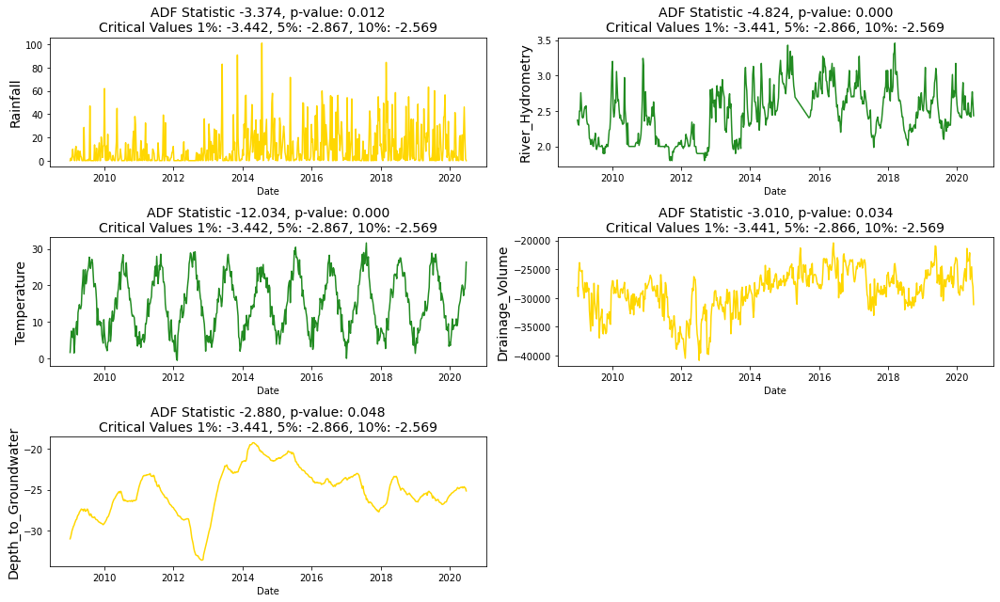

In [37]:
f, ax = plt.subplots(nrows=3, ncols=2, figsize=(15, 9))
visualize_adfuller_results(df.Rainfall.values, 'Rainfall', ax[0, 0])
visualize_adfuller_results(df.Temperature.values, 'Temperature', ax[1, 0])
visualize_adfuller_results(df.River_Hydrometry.values, 'River_Hydrometry', ax[0, 1])
visualize_adfuller_results(df.Drainage_Volume.values, 'Drainage_Volume', ax[1, 1])
visualize_adfuller_results(df.Depth_to_Groundwater.values, 'Depth_to_Groundwater', ax[2, 0])

f.delaxes(ax[2, 1])
plt.tight_layout()
plt.show()

As we can see, the data is somewhat stationary when we check the statistics behind the scenes. But we can make it better by transforming our features

# 5. Time series transformation

If the data is not stationary but we want to use a model that requires with characteristic, the data has to be transformed. However, if the data is not stationary to begin with, we should rethink the choice of model.

The two most common methods to achieve stationarity are:

Transformation: e.g. log or square root to stabilize non-constant variance
Differencing: subtracts the current value from the previous

In [38]:
# Log Transform of absolute values
# (Log transoform of negative values will return NaN)
df['Depth_to_Groundwater_log'] = np.log(abs(df.Depth_to_Groundwater))

# First Order Differencing
ts_diff = np.diff(df.Depth_to_Groundwater)
df['Depth_to_Groundwater_diff_1'] = np.append([0], ts_diff)

# Second Order Differencing
ts_diff = np.diff(df.Depth_to_Groundwater_diff_1)
df['Depth_to_Groundwater_diff_2'] = np.append([0], ts_diff)

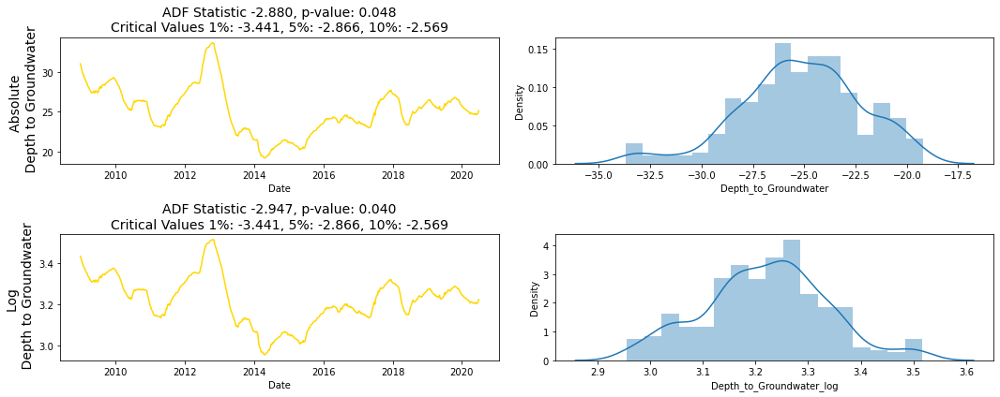

In [39]:
f, ax = plt.subplots(nrows=2, ncols=2, figsize=(15, 6))
visualize_adfuller_results(abs(df.Depth_to_Groundwater), 'Absolute \n Depth to Groundwater', ax[0, 0])

sns.distplot(df.Depth_to_Groundwater, ax=ax[0, 1])
visualize_adfuller_results(df.Depth_to_Groundwater_log, 'Log \n Depth to Groundwater', ax[1, 0])

sns.distplot(df.Depth_to_Groundwater_log, ax=ax[1, 1])

plt.tight_layout()
plt.show()

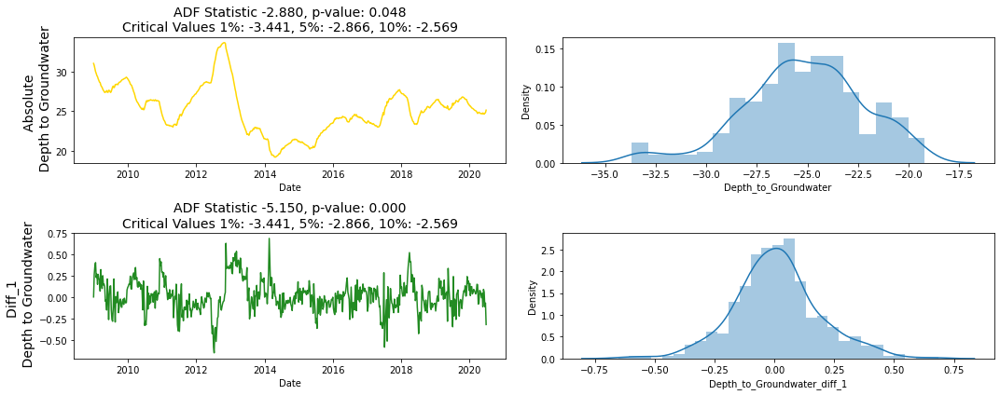

In [40]:
f, ax = plt.subplots(nrows=2, ncols=2, figsize=(15, 6))
visualize_adfuller_results(abs(df.Depth_to_Groundwater), 'Absolute \n Depth to Groundwater', ax[0, 0])

sns.distplot(df.Depth_to_Groundwater, ax=ax[0, 1])
visualize_adfuller_results(df.Depth_to_Groundwater_diff_1, 'Diff_1 \n Depth to Groundwater', ax[1, 0])

sns.distplot(df.Depth_to_Groundwater_diff_1, ax=ax[1, 1])

plt.tight_layout()
plt.show()

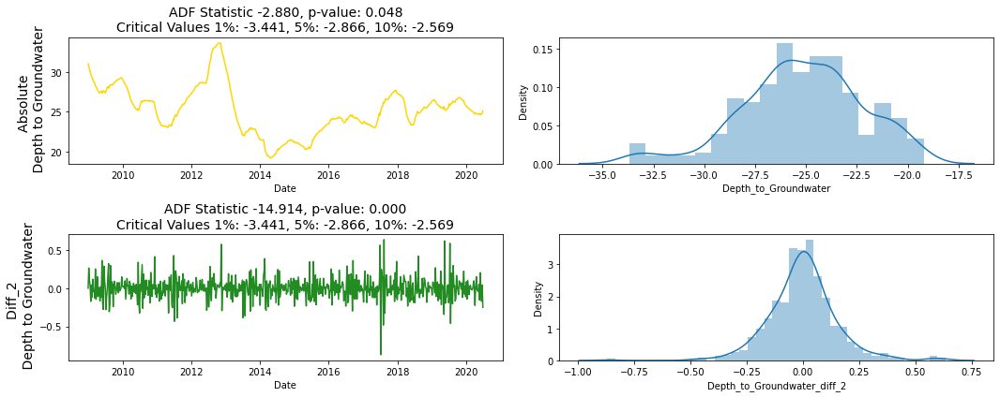

In [41]:
f, ax = plt.subplots(nrows=2, ncols=2, figsize=(15, 6))
visualize_adfuller_results(abs(df.Depth_to_Groundwater), 'Absolute \n Depth to Groundwater', ax[0, 0])

sns.distplot(df.Depth_to_Groundwater, ax=ax[0, 1])
visualize_adfuller_results(df.Depth_to_Groundwater_diff_2, 'Diff_2 \n Depth to Groundwater', ax[1, 0])

sns.distplot(df.Depth_to_Groundwater_diff_2, ax=ax[1, 1])

plt.tight_layout()
plt.show()

# 6. Feature Engineering

In [42]:
df['year'] = pd.DatetimeIndex(df['Date']).year
df['month'] = pd.DatetimeIndex(df['Date']).month
df['day'] = pd.DatetimeIndex(df['Date']).day
df['day_of_year'] = pd.DatetimeIndex(df['Date']).dayofyear
df['week_of_year'] = pd.DatetimeIndex(df['Date']).weekofyear
df['quarter'] = pd.DatetimeIndex(df['Date']).quarter
df['season'] = df.month%12 // 3 + 1

df[['Date', 'year', 'month', 'day', 'day_of_year', 'week_of_year', 'quarter', 'season']].head()

,Date,year,month,day,day_of_year,week_of_year,quarter,season
0,2009-01-01,2009,1,1,1,1,1,1
1,2009-01-08,2009,1,8,8,2,1,1
2,2009-01-15,2009,1,15,15,3,1,1
3,2009-01-22,2009,1,22,22,4,1,1
4,2009-01-29,2009,1,29,29,5,1,1


## 6.1 Cyclical features

The new time features are cyclical. For example,the feature month cycles between 1 and 12 for every year. While the difference between each month increments by 1 during the year, between two years the month feature jumps from 12 (December) to 1 (January). This results in a -11 difference, which can confuse a lot of models.

Ideally, we want the underlying data to represent the same difference between two consecutive months, even between December and January. A common remedy for this issue is to encode cyclical features into two dimensions with sine and cosine transformation.

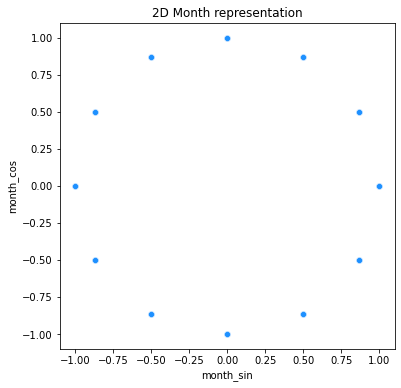

In [43]:
month_in_year = 12
df['month_sin'] = np.sin(2*np.pi*df.month/month_in_year)
df['month_cos'] = np.cos(2*np.pi*df.month/month_in_year)

days_in_month = 30
df['day_sin'] = np.sin(2*np.pi*df.day/days_in_month)
df['day_cos'] = np.cos(2*np.pi*df.day/days_in_month)

days_in_year = 365
df['day_of_year_sin'] = np.sin(2*np.pi*df.day_of_year/days_in_year)
df['day_of_year_cos'] = np.cos(2*np.pi*df.day_of_year/days_in_year)

weeks_in_year = 52.1429
df['week_of_year_sin'] = np.sin(2*np.pi*df.week_of_year/weeks_in_year)
df['week_of_year_cos'] = np.cos(2*np.pi*df.week_of_year/weeks_in_year)

quarters_in_year = 4
df['quarter_sin'] = np.sin(2*np.pi*df.quarter/quarters_in_year)
df['quarter_cos'] = np.cos(2*np.pi*df.quarter/quarters_in_year)

seasons_in_year = 4
df['season_sin'] = np.sin(2*np.pi*df.season/seasons_in_year)
df['season_cos'] = np.cos(2*np.pi*df.season/seasons_in_year)

f, ax = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))

sns.scatterplot(x=df.month_sin, y=df.month_cos, color='dodgerblue')
plt.title('2D Month representation')
plt.show()

## 6.2. Decomposition

The characteristics of a time series are:

- Trend and Level
- Seasonality
- Random / Noise

We can use the function seasonal_decompose() from the statsmodels library.

- Additive:  $y(t)=Level+Trend+Seasonality+Noise $
- Multiplicative:  $y(t)=Level∗Trend∗Seasonality∗Noise$

In [44]:
from statsmodels.tsa.seasonal import seasonal_decompose

decompose_cols =  ['Rainfall', 'Temperature', 
                   'Drainage_Volume', 
                   'River_Hydrometry', 'Depth_to_Groundwater']

for col in decompose_cols:
    decomp = seasonal_decompose(df[col], freq=52, model='additive', extrapolate_trend='freq')
    df[f"{col}_trend"] = decomp.trend
    df[f"{col}_seasonal"] = decomp.seasonal

In [45]:
res = seasonal_decompose(df.Temperature, freq=52, model='additive', extrapolate_trend='freq')

fig = make_subplots(rows=4, cols=2,#subplot_titles=("Daily Rainfall", 'Weekly Rainfall',
                                                  # 'Monthly Rainfall', 'Daily Temperature','Weekly Temperature',
                                                #  'Monthly Temperature'),
                                                    shared_xaxes=True)
fig.add_trace(
    go.Scatter(x=df.Date, y=res.observed,
              mode = 'lines',
              name = 'Temperature observed'),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(y=res.trend,
               x=df.Date,
               mode = 'lines',
               name = 'Temp trend'),
    row=2, col=1
)


fig.add_trace(
    go.Scatter(y=res.seasonal,
               x=df.Date,
               mode = 'lines',
               name = 'Temp seasonal'),
    row=3, col=1
)


fig.add_trace(
    go.Scatter(y=res.resid,
               x=df.Date,
               mode = 'lines',
               name = 'Temp residual'),
    row=4, col=1
)

res = seasonal_decompose(df.Depth_to_Groundwater, freq=52, model='additive', extrapolate_trend='freq')


fig.add_trace(
    go.Scatter(x=df.Date, y=res.observed,
              mode = 'lines',
              name = 'Depth observed'),
    row=1, col=2
)

fig.add_trace(
    go.Scatter(y=res.trend,
               x=df.Date,
               mode = 'lines',
               name = 'Depth trend'),
    row=2, col=2
)


fig.add_trace(
    go.Scatter(y=res.seasonal,
               x=df.Date,
               mode = 'lines',
               name = 'Depth seasonal'),
    row=3, col=2
)


fig.add_trace(
    go.Scatter(y=res.resid,
               x=df.Date,
               mode = 'lines',
               name = 'Depth residual'),
    row=4, col=2
)
fig.update_layout(height=800, width=1000, title_text="               Temperature decomposition  \
                     x       \
        Depth decomposition")
fig.show()

## 6.3. Lag

In [46]:
weeks_in_month = 4

df['Temperature_seasonal_shift_r_2M'] = df.Temperature_seasonal.shift(-2*weeks_in_month)
df['Temperature_seasonal_shift_r_1M'] = df.Temperature_seasonal.shift(-1*weeks_in_month)
df['Temperature_seasonal_shift_1M'] = df.Temperature_seasonal.shift(1*weeks_in_month)
df['Temperature_seasonal_shift_2M'] = df.Temperature_seasonal.shift(2*weeks_in_month)
df['Temperature_seasonal_shift_3M'] = df.Temperature_seasonal.shift(3*weeks_in_month)

df['Drainage_Volume_seasonal_shift_r_2M'] = df.Drainage_Volume_seasonal.shift(-2*weeks_in_month)
df['Drainage_Volume_seasonal_shift_r_1M'] = df.Drainage_Volume_seasonal.shift(-1*weeks_in_month)
df['Drainage_Volume_seasonal_shift_1M'] = df.Drainage_Volume_seasonal.shift(1*weeks_in_month)
df['Drainage_Volume_seasonal_shift_2M'] = df.Drainage_Volume_seasonal.shift(2*weeks_in_month)
df['Drainage_Volume_seasonal_shift_3M'] = df.Drainage_Volume_seasonal.shift(3*weeks_in_month)

df['River_Hydrometry_seasonal_shift_r_2M'] = df.River_Hydrometry_seasonal.shift(-2*weeks_in_month)
df['River_Hydrometry_seasonal_shift_r_1M'] = df.River_Hydrometry_seasonal.shift(-1*weeks_in_month)
df['River_Hydrometry_seasonal_shift_1M'] = df.River_Hydrometry_seasonal.shift(1*weeks_in_month)
df['River_Hydrometry_seasonal_shift_2M'] = df.River_Hydrometry_seasonal.shift(2*weeks_in_month)
df['River_Hydrometry_seasonal_shift_3M'] = df.River_Hydrometry_seasonal.shift(3*weeks_in_month)


In [47]:
trace1 = go.Scatter(
    x = df['Date'],
    y = df.Temperature_seasonal_shift_r_2M,
    mode = 'lines',
    name = 'Shift -2M'
)

trace2 = go.Scatter(
    x = df['Date'],
    y = df.Temperature_seasonal_shift_r_1M,
    mode = 'lines',
    name = 'Shift -1M'
    )

trace3 = go.Scatter(
    x = df['Date'],
    y = df.Temperature_seasonal_shift_1M,
    mode = 'lines',
    name = 'Shift +1M'
    )   

trace4 = go.Scatter(
    x = df['Date'],
    y = df.Temperature_seasonal_shift_2M,
    mode = 'lines',
    name = 'Shift +2M'
    )    


layout = dict(
    title='Shifted temperature trends together',
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                #change the count to desired amount of months.
                dict(count=1,
                     label='1m',
                     step='month',
                     stepmode='backward'),
                dict(count=6,
                     label='6m',
                     step='month',
                     stepmode='backward'),
                dict(count=12,
                     label='1y',
                     step='month',
                     stepmode='backward'),
                dict(count=36,
                     label='3y',
                     step='month',
                     stepmode='backward'),
                dict(count=60,
                     label='5y',
                     step='month',
                     stepmode='backward'),
                dict(step='all')
            ])
        ),
        rangeslider=dict(
            visible = True
        ),
        type='date'
    )
)

data = [trace1,trace2,trace3,trace4]

fig = dict(data=data, layout=layout)
iplot(fig, filename = "Time Series with Rangeslider")

# 7. Exploratory data analysis

## 7.1. Seasonal components

In [48]:
res = seasonal_decompose(df.Temperature, freq=52, model='additive', extrapolate_trend='freq')

fig = make_subplots(rows=5, cols=1,#subplot_titles=("Daily Rainfall", 'Weekly Rainfall',
                                                  # 'Monthly Rainfall', 'Daily Temperature','Weekly Temperature',
                                                #  'Monthly Temperature'),
                                                    shared_xaxes=True)
fig.add_trace(
    go.Scatter(x=df.Date, y=df.Depth_to_Groundwater_seasonal,
              mode = 'lines',
              name = 'Depth'),
    row=5, col=1
)

fig.add_trace(
    go.Scatter(y=df.Drainage_Volume_seasonal,
               x=df.Date,
               mode = 'lines',
               name = 'Volume'),
    row=2, col=1
)


fig.add_trace(
    go.Scatter(y=df.River_Hydrometry_seasonal,
               x=df.Date,
               mode = 'lines',
               name = 'Hydrometry'),
    row=3, col=1
)


fig.add_trace(
    go.Scatter(y=df.Rainfall_seasonal,
               x=df.Date,
               mode = 'lines',
               name = 'Rainfall'),
    row=4, col=1
)

res = seasonal_decompose(df.Depth_to_Groundwater, freq=52, model='additive', extrapolate_trend='freq')


fig.add_trace(
    go.Scatter(x=df.Date, y=df.Temperature_seasonal,
              mode = 'lines',
              name = 'Temperature'),
    row=1, col=1
)


layout = dict(
    title='Shifted temperature trends together',
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                #change the count to desired amount of months.
                dict(count=1,
                     label='1m',
                     step='month',
                     stepmode='backward'),
                dict(count=6,
                     label='6m',
                     step='month',
                     stepmode='backward'),
                dict(count=12,
                     label='1y',
                     step='month',
                     stepmode='backward'),
                dict(count=36,
                     label='3y',
                     step='month',
                     stepmode='backward'),
                dict(count=60,
                     label='5y',
                     step='month',
                     stepmode='backward'),
                dict(step='all')
            ])
        ),
        rangeslider=dict(
            visible = True
        ),
        type='date'
    )
)

fig.update_layout(height=800, width=1000, title_text="Seasonal analysis")

fig.show()

- The depth to groundwater reaches its maximum around May/June and its minimum around November/December
- The temperature reaches its maxmium around August and its minimum around January
- The volume reaches its maximum around June and its minimum around August/September. It takes longer to reach its maximum than to reach its minimum.
- The hydrometry reaches its maximum around March and its minimum around September
- The volume and hydrometry reach their minimum roughly around the same time
- The volume and hydrometry reach their minimum when the temperature reaches its maximum temperature lags begind depth to groundwater by around 2 to 3 months

## 7.2. Correlations

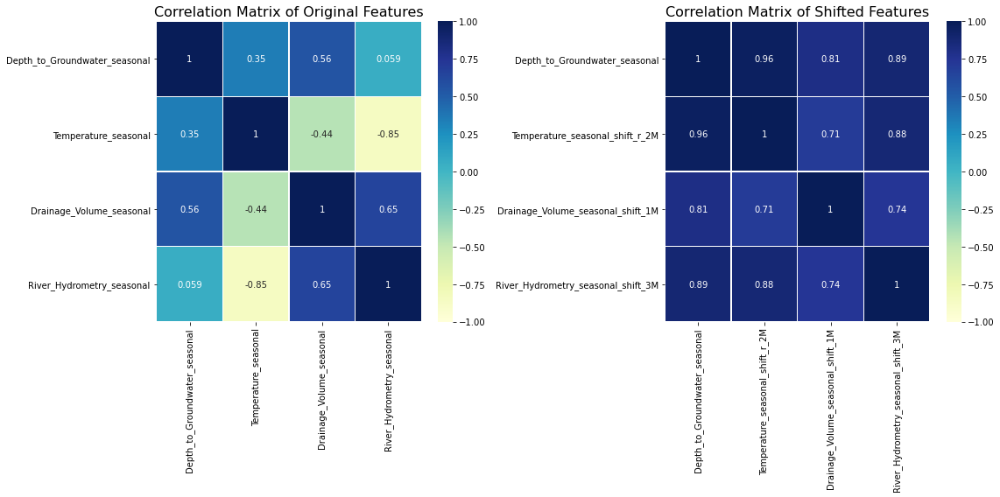

In [49]:
f, ax = plt.subplots(nrows=1, ncols=2, figsize=(16, 8))

original_cols = ['Depth_to_Groundwater_seasonal', 
                 'Temperature_seasonal',
                 'Drainage_Volume_seasonal', 'River_Hydrometry_seasonal']

corrmat = df[original_cols].corr()


sns.heatmap(corrmat, annot=True, vmin=-1, vmax=1, cmap="YlGnBu", ax=ax[0],linewidths=.2)
ax[0].set_title('Correlation Matrix of Original Features', fontsize=16)

shifted_cols = [ 'Depth_to_Groundwater_seasonal', 
                'Temperature_seasonal_shift_r_2M',
                'Drainage_Volume_seasonal_shift_1M', 'River_Hydrometry_seasonal_shift_3M']
corrmat = df[shifted_cols].corr()

sns.heatmap(corrmat, annot=True, vmin=-1, vmax=1, cmap="YlGnBu", ax=ax[1],linewidths=.2)
ax[1].set_title('Correlation Matrix of Shifted Features', fontsize=16)


plt.tight_layout()
plt.show()

## 7.3. Autocorrelation

This EDA step is especially important when using ARIMA. The autocorrelation analysis helps to identify the AR and MA parameters for the ARIMA model.

**Autocorrelation Function (ACF)**: Correlation between time series with a lagged version of itself. The autocorrelation function starts a lag 0, which is the correlation of the time series with itself and therefore results in a correlation of 1. -> MA parameter is q significant lags


**Partial Autocorrelation Function (PACF)**: Additional correlation explained by each successive lagged term -> AR parameter is p significant lags
Autocorrelation pluts help in detecting seasonality.

A good starting point for the AR parameter of the model may be TODO.

As we can infer from the graph above, the autocorrelation continues to decrease as the lag increases, confirming that there is no linear association between observations separated by larger lags.

For the AR process, we expect that the ACF plot will gradually decrease and simultaneously the PACF should have a sharp drop after p significant lags. To define a MA process, we expect the opposite from the ACF and PACF plots, meaning that: the ACF should show a sharp drop after a certain q number of lags while PACF should show a geometric or gradual decreasing trend.

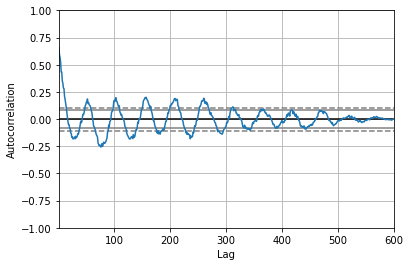

In [50]:
from pandas.plotting import autocorrelation_plot
autocorrelation_plot(df.Depth_to_Groundwater_diff_1)
plt.show()

We can see some sinusoidal shape in both ACF and PACF functions. This suggests that both AR and MA processes are present.

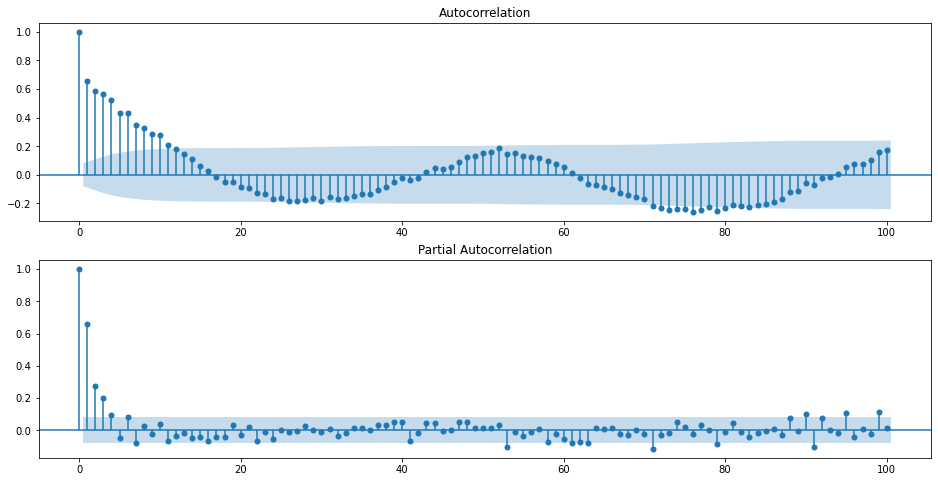

In [51]:
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf

f, ax = plt.subplots(nrows=2, ncols=1, figsize=(16, 8))

plot_acf(df.Depth_to_Groundwater_diff_1,lags=100, ax=ax[0])
plot_pacf(df.Depth_to_Groundwater_diff_1,lags=100, ax=ax[1])
plt.show()

# 8. Cross Validation

In [52]:
#Time Series Split library
from sklearn.model_selection import TimeSeriesSplit

N_SPLITS = 4

X = df.Date
y = df.Depth_to_Groundwater

folds = TimeSeriesSplit(n_splits=N_SPLITS)
folds

TimeSeriesSplit(gap=0, max_train_size=None, n_splits=4, test_size=None)

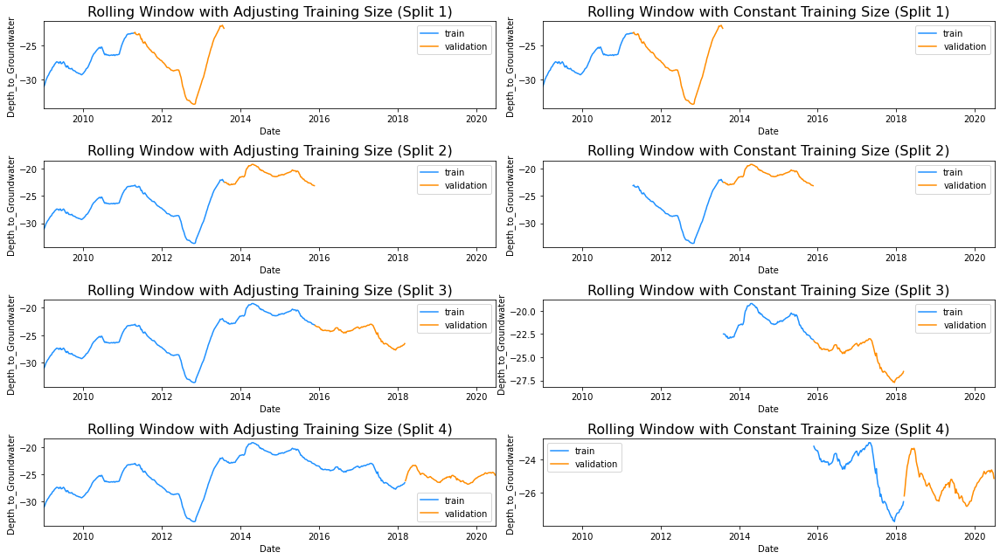

In [53]:
f, ax = plt.subplots(nrows=N_SPLITS, ncols=2, figsize=(16, 9))

for i, (train_index, valid_index) in enumerate(folds.split(X)):
    X_train, X_valid = X[train_index], X[valid_index]
    y_train, y_valid = y[train_index], y[valid_index]

    sns.lineplot(x= X_train, y= y_train, ax=ax[i,0], color='dodgerblue', label='train')
    sns.lineplot(x= X_train[len(X_train) - len(X_valid):(len(X_train) - len(X_valid) + len(X_valid))], 
                 y= y_train[len(X_train) - len(X_valid):(len(X_train) - len(X_valid) + len(X_valid))], 
                 ax=ax[i,1], color='dodgerblue', label='train')

    for j in range(2):
        sns.lineplot(x= X_valid, y= y_valid, ax=ax[i, j], color='darkorange', label='validation')
    ax[i, 0].set_title(f"Rolling Window with Adjusting Training Size (Split {i+1})", fontsize=16)
    ax[i, 1].set_title(f"Rolling Window with Constant Training Size (Split {i+1})", fontsize=16)

for i in range(N_SPLITS):
    ax[i, 0].set_xlim([date(2009, 1, 1), date(2020, 6, 30)])
    ax[i, 1].set_xlim([date(2009, 1, 1), date(2020, 6, 30)])
plt.tight_layout()
plt.show()

In [54]:
from feature_engine.selection import DropCorrelatedFeatures, SmartCorrelatedSelection
# set up the selector

sel = DropCorrelatedFeatures(
    threshold=0.8,
    method='pearson',
    missing_values='ignore'
)


# find correlated features

sel.fit(df)
df = sel.transform(df)

<AxesSubplot:>

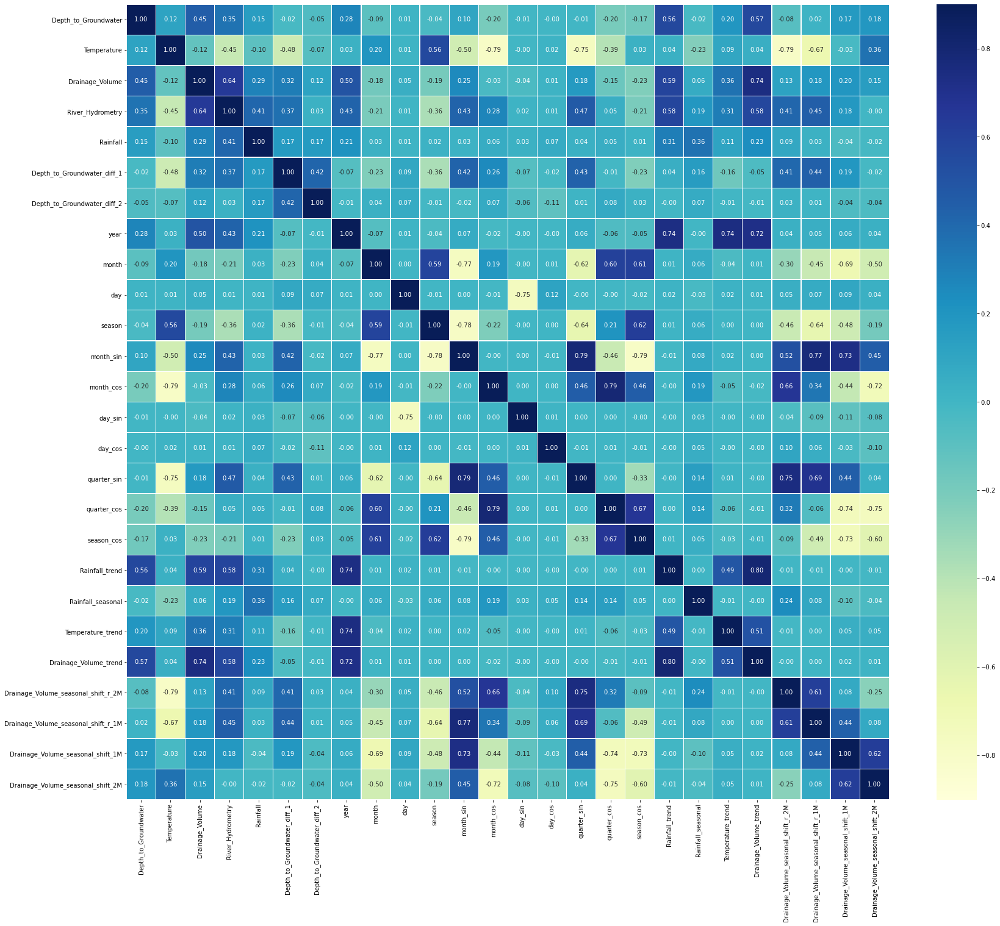

In [55]:
corr = df.corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
# Heatmap
plt.figure(figsize=(28, 24))
sns.heatmap(corr,
            vmax=0.9,
            vmin = -0.9,
           # mask=mask,
           annot=True,
            fmt='.2f',
            linewidths=.2,
            cmap="YlGnBu"
           )

In [56]:
df.drop(["Drainage_Volume_seasonal_shift_1M","Drainage_Volume_seasonal_shift_r_1M","Drainage_Volume_seasonal_shift_r_2M"],
        axis=1,inplace=True)

In [57]:
df.drop(["Depth_to_Groundwater","Depth_to_Groundwater_diff_1"],
        axis=1,inplace=True)

# 9. Building Models

## 9.1. VAR    

In [58]:
#creating the train and validation set
#df.index = df.Date
#df.drop('Date',axis=1,inplace =True)
df = df.dropna()
df = df.loc[:, (df != df.iloc[0]).any()]
train = df[:int(0.8*(len(df)))].dropna()
valid = df[int(0.8*(len(df))):].dropna()
target

#fit the model
from statsmodels.tsa.vector_ar.var_model import VAR

#make final predictions
model = VAR(endog=df)
model_fit = model.fit()
yhat = model_fit.forecast(model_fit.y, steps=1)
print(yhat)

NameError: name 'target' is not defined

In [ ]:
prediction

In [ ]:
pred = pd.DataFrame(index=valid.index,columns=df.columns)
for j in range(0,13):
    for i in range(0, len(prediction)):
           pred.iloc[i][j] = prediction[i][j]



#check rmse
for i in df.columns:
    print('rmse value for', i, 'is : ', np.sqrt(mean_squared_error(pred[i], valid[i])))

In [ ]:
df['Depth_to_Groundwater_diff_2'].loc[] - pred

In [ ]:
#sns.lineplot(x=df.index, y=df.Depth_to_Groundwater_diff_2, color='darkorange', label = 'original')
sns.lineplot(x=pred.index, y=pred.Depth_to_Groundwater_diff_2, color='dodgerblue', label = 'modified')